# Лабораторная работа №6. Дискретное косинусное преобразрвание
## Жилкина Лада, 5130901/10202

In [27]:
import numpy as np
import sys
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import linregress
sys.path.append('../')
from thinkdsp import read_wave, decorate, Spectrogram, UncorrelatedGaussianNoise

## Упражнение 6.1

В этой главе утверждается, что analyze1 требует времени пропорционально
n^3, а analyze2 - пропорционально n^2. Убедимся в этом, запуская их с несколькими разными массивами и засекая время работы.
Если печатать зависимость времени работы от размера на логарифмической шкале, то должна получиться прямая линия с уклоном 3 для analyze1 и с уклоном 2 для analyze2.
Также поупражняемся с dct_iv и scipy.fftpack.dct.

Создадим шумовой сигнал:

In [12]:
signal = UncorrelatedGaussianNoise()
noise = signal.make_wave(duration=1.0, framerate=16384)
noise.ys.shape

(16384,)

Создадим функцию отображения результатов анализа, которая аппроксимирует результат прямой линией:

In [13]:
loglog = dict(xscale='log', yscale='log')

def plot_bests(ns, bests):    
    plt.plot(ns, bests)
    decorate(**loglog)
    
    x = np.log(ns)
    y = np.log(bests)
    t = linregress(x,y)
    slope = t[0]

    return slope
PI2 = np.pi * 2

def analyze1(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.linalg.solve(M, ys)
    return amps

def run_speed_test(ns, func):
    results = []
    for N in ns:
        print(N)
        ts = (0.5 + np.arange(N)) / N
        freqs = (0.5 + np.arange(N)) / 2
        ys = noise.ys[:N]
        result = %timeit -r1 -o func(ys, freqs, ts)
        results.append(result)
        
    bests = [result.best for result in results]
    return bests

Протестируем. Результаты для analyze1:

64
1.85 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
128
3 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
256
6.14 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
512
23.2 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
1024
46.9 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
2048
174 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
4096
710 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


1.4427596095221713

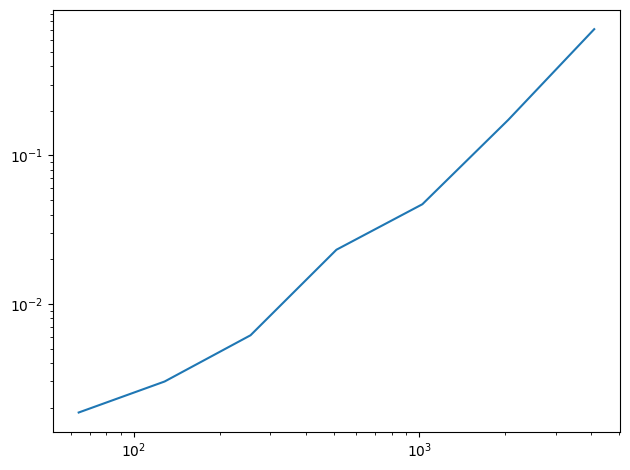

In [14]:
ns = 2 ** np.arange(6, 13)
bests = run_speed_test(ns, analyze1)
plot_bests(ns, bests)

Напишем функцию analyze2:

In [15]:
def analyze2(ys, fs, ts):
    args = np.outer(ts, fs)
    M = np.cos(PI2 * args)
    amps = np.dot(M, ys) / 2
    return amps

Протестируем её:

64
49.8 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)
128
249 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
256
677 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
512
3.8 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
1024
16 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
2048
58.8 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
4096
215 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


2.020211438817223

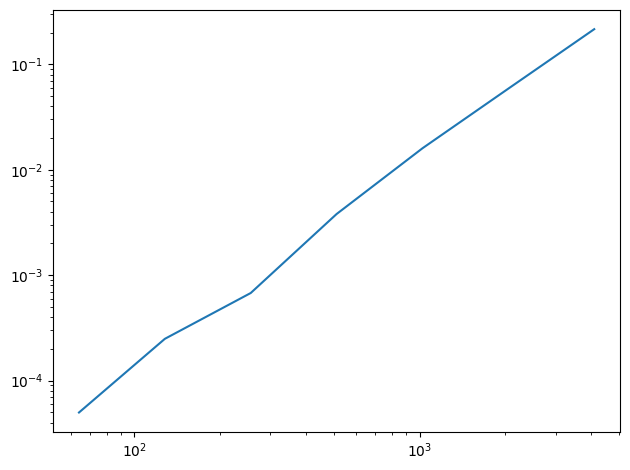

In [16]:
bests2 = run_speed_test(ns, analyze2)
plot_bests(ns, bests2)

Как и ожидалось, в результате получена почти прямая линия с наклоном, близким к 2.

Протестируем scipy.fftpack.dct:

64
4.25 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
128
4.97 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
256
5.48 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
512
6.08 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
1024
7.83 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
2048
12.3 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 100,000 loops each)
4096
25.2 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)


0.3873288775201321

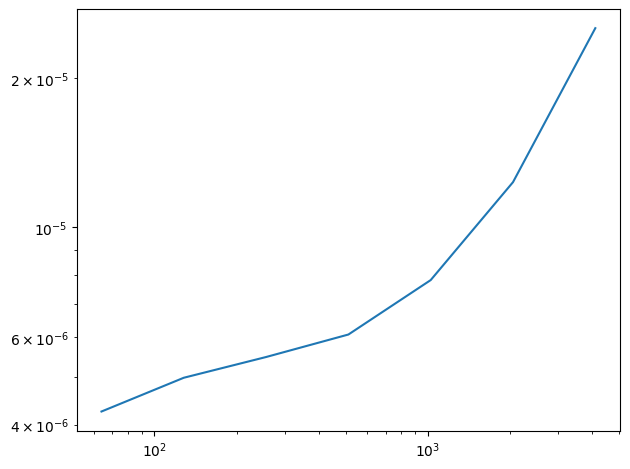

In [17]:
import scipy.fftpack

def scipy_dct(ys, freqs, ts):
    return scipy.fftpack.dct(ys, type=3)
    
bests3 = run_speed_test(ns, scipy_dct)
plot_bests(ns, bests3)

По графику видно, что функция работает быстрее, время её работы пропорционально N * log(N).

Протестируем dct_iv:

64
49.4 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 10,000 loops each)
128
227 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
256
633 µs ± 0 ns per loop (mean ± std. dev. of 1 run, 1,000 loops each)
512
3.95 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
1024
14.4 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 100 loops each)
2048
52.9 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 10 loops each)
4096
247 ms ± 0 ns per loop (mean ± std. dev. of 1 run, 1 loop each)


2.039503779470732

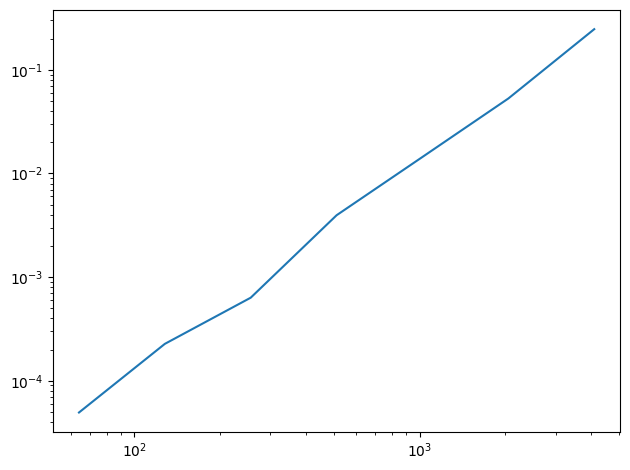

In [18]:
def dct_iv(ys, freqs, ts):
  N = len(ys)
  ts = (0.5 + np.arange(N))/N
  fs = (0.5 + np.arange(N))/2
  args = np.outer(ts,fs)
  M = np.cos(PI2*args)
  amps = np.dot(M, ys) / 2
  return amps

best4 = run_speed_test(ns, dct_iv)
plot_bests(ns, best4)

Результат - линия с наклоном около 1.9.

## Упражнение 6.2

Oдно из основных применений ДКП - это сжатие звука и изображений.
В простейшей форме ДКП при сжатии работает следующим
образом:
1. Разбивает длинный сигнал на сегменты.
2. Вычисляет ДКП каждого сегмента.
3. Определяет частотные компоненты с такой амплитудой, что
их не слышно, и удаляет их, сохраняя только оставшиеся частоты
и амплитуды.
4. При воспроизведении сигнала загружает частоты и амплитуды
каждого сегмента и применяет обратное ДКП.

Реализуем версию этого алгоритма и применим его для записи
музыки или речи. Посмотрим, сколько компонент можно удалить до того, как
разница станет заметной.

Послушаем запись:

In [20]:
wave = read_wave('649796__timouse__piano-loop-23.wav')
wave.make_audio()

Извлечём фрагмент:

In [21]:
segment = wave.segment(start=1, duration=0.5)
segment.normalize()
segment.make_audio()

Получим ДКП сигнала:

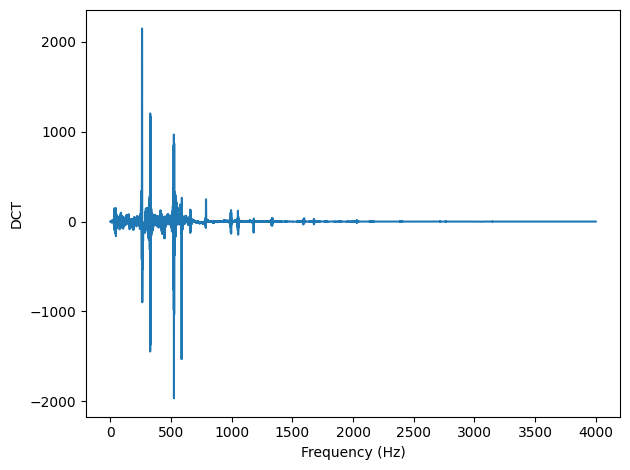

In [22]:
seg_dct = segment.make_dct()
seg_dct.plot(high=4000)
decorate(xlabel='Frequency (Hz)', ylabel='DCT')

Напишем функцию, которая убирает из ДКП частоты со значениями ниже заданного treshold:

In [24]:
def compress(dct, thresh=1):
    count = 0
    for i, amp in enumerate(dct.amps):
        if np.abs(amp) < thresh:
            dct.hs[i] = 0
            count += 1
            
    n = len(dct.amps)
    print(count, n, 100 * count / n, sep='\t')

Применим функцию к заданному сигналу:

19099	22050	86.61678004535148


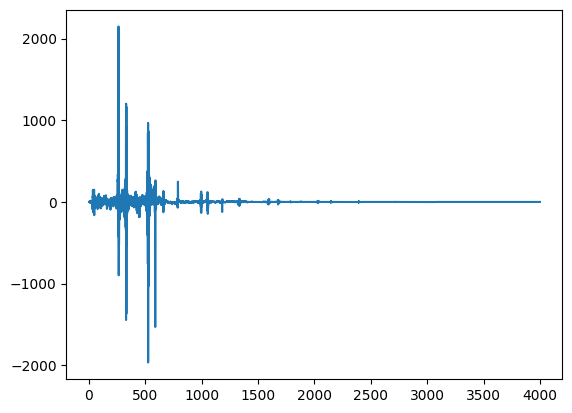

In [25]:
seg_dct = segment.make_dct()
compress(seg_dct, thresh=1)
seg_dct.plot(high=4000)

In [26]:
seg2 = seg_dct.make_wave()
seg2.make_audio()

Звук почти не изменился.
Создадим функцию, которая позволит получить спектрограмму ДКП:

In [28]:
def make_dct_spectrogram(wave, seg_length):
    window = np.hamming(seg_length)
    i, j = 0, seg_length
    step = seg_length // 2

    spec_map = {}

    while j < len(wave.ys):
        segment = wave.slice(i, j)
        segment.window(window)

        t = (segment.start + segment.end) / 2
        spec_map[t] = segment.make_dct()

        i += step
        j += step

    return Spectrogram(spec_map, seg_length)

Теперь можно сжать все сегменты ДСП:

In [29]:
spectro = make_dct_spectrogram(wave, seg_length=1024)
for t, dct in sorted(spectro.spec_map.items()):
    compress(dct, thresh=0.002)

173	1024	16.89453125
200	1024	19.53125
201	1024	19.62890625
233	1024	22.75390625
212	1024	20.703125
257	1024	25.09765625
199	1024	19.43359375
207	1024	20.21484375
219	1024	21.38671875
233	1024	22.75390625
227	1024	22.16796875
236	1024	23.046875
213	1024	20.80078125
233	1024	22.75390625
236	1024	23.046875
214	1024	20.8984375
240	1024	23.4375
255	1024	24.90234375
269	1024	26.26953125
253	1024	24.70703125
260	1024	25.390625
238	1024	23.2421875
250	1024	24.4140625
272	1024	26.5625
250	1024	24.4140625
255	1024	24.90234375
282	1024	27.5390625
195	1024	19.04296875
207	1024	20.21484375
186	1024	18.1640625
229	1024	22.36328125
204	1024	19.921875
168	1024	16.40625
186	1024	18.1640625
184	1024	17.96875
197	1024	19.23828125
221	1024	21.58203125
171	1024	16.69921875
212	1024	20.703125
221	1024	21.58203125
223	1024	21.77734375
217	1024	21.19140625
215	1024	20.99609375
199	1024	19.43359375
221	1024	21.58203125
226	1024	22.0703125
226	1024	22.0703125
225	1024	21.97265625
229	1024	22.36328125
229	1024	

In [30]:
wave2 = spectro.make_wave()
wave2.make_audio()

Если увеличить сжатие, то становятся заметны шумы:

In [33]:
spectro = make_dct_spectrogram(wave, seg_length=1024)
for t, dct in sorted(spectro.spec_map.items()):
    compress(dct, thresh=0.1)

874	1024	85.3515625
906	1024	88.4765625
910	1024	88.8671875
916	1024	89.453125
915	1024	89.35546875
930	1024	90.8203125
933	1024	91.11328125
927	1024	90.52734375
928	1024	90.625
936	1024	91.40625
936	1024	91.40625
936	1024	91.40625
937	1024	91.50390625
937	1024	91.50390625
940	1024	91.796875
945	1024	92.28515625
960	1024	93.75
959	1024	93.65234375
959	1024	93.65234375
973	1024	95.01953125
967	1024	94.43359375
977	1024	95.41015625
984	1024	96.09375
992	1024	96.875
989	1024	96.58203125
992	1024	96.875
993	1024	96.97265625
928	1024	90.625
817	1024	79.78515625
827	1024	80.76171875
856	1024	83.59375
862	1024	84.1796875
868	1024	84.765625
860	1024	83.984375
883	1024	86.23046875
884	1024	86.328125
882	1024	86.1328125
887	1024	86.62109375
897	1024	87.59765625
888	1024	86.71875
903	1024	88.18359375
895	1024	87.40234375
898	1024	87.6953125
908	1024	88.671875
910	1024	88.8671875
921	1024	89.94140625
927	1024	90.52734375
920	1024	89.84375
936	1024	91.40625
929	1024	90.72265625
944	1024	92.1875
942

In [34]:
wave2 = spectro.make_wave()
wave2.make_audio()

## Упражнение 6.3
Загрузим и послушаем запись:

In [35]:
wave = read_wave('77685__juskiddink__anna-britta-sax.wav')
wave.make_audio()

Выделим фрагмент исходной записи:

In [36]:
segment = wave.segment(start=1, duration=0.5)
segment.normalize()
segment.make_audio()

Напишем функции для вывода амплитуды, углов и waveform заданного спектра:

In [38]:
def plot_angle(spectrum, thresh=1):
    angles = spectrum.angles
    angles[spectrum.amps < thresh] = np.nan
    plt.plot(spectrum.fs, angles, 'x')
    decorate(xlabel='Frequency (Hz)', 
             ylabel='Phase (radian)')
    
def plot_three(spectrum, thresh=1):
    plt.figure(figsize=(10, 4))
    plt.subplot(1,3,1)
    spectrum.plot()
    plt.subplot(1,3,2)
    plot_angle(spectrum, thresh=thresh)
    plt.subplot(1,3,3)
    wave = spectrum.make_wave()
    wave.unbias()
    wave.normalize()
    wave.segment(duration=0.01).plot()
    display(wave.make_audio())

Получим данные для изначального сегмента:

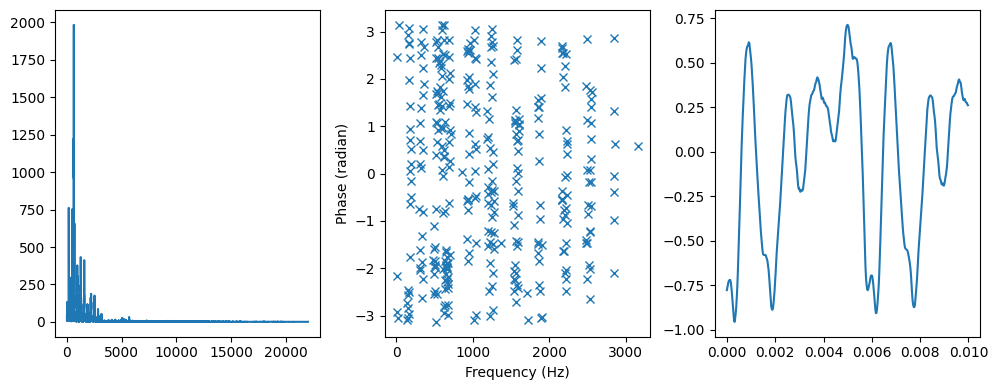

In [39]:
spectrum = segment.make_spectrum()
plot_three(spectrum, thresh=50)

Напишем функцию для обнуления всех углов сегмента:

In [41]:
def zero_angle(spectrum):
    res = spectrum.copy()
    res.hs = res.amps
    return res

Протестируем её:

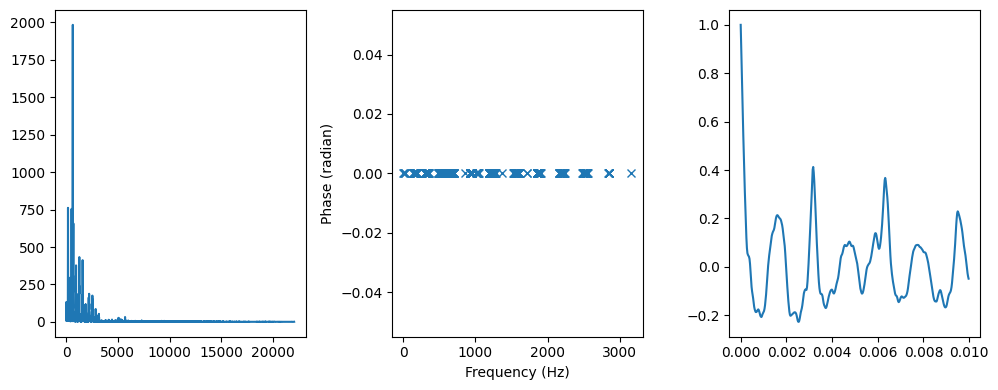

In [42]:
spectrum2 = zero_angle(spectrum)
plot_three(spectrum2, thresh=50)

Запись стала намного тише.

Напишем функцию для поворота углов на 1 радиан и проверим её работу:

In [43]:
def rotate_angle(spectrum, offset):
    res = spectrum.copy()
    res.hs *= np.exp(1j * offset)
    return res

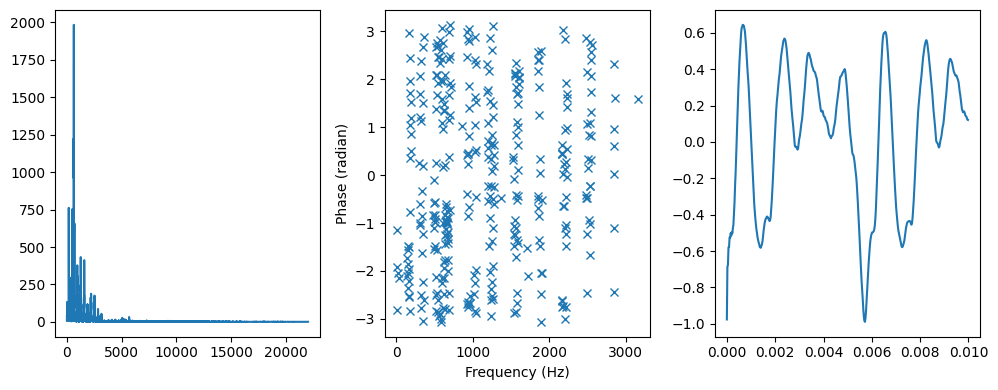

In [44]:
spectrum3 = rotate_angle(spectrum, 1)
plot_three(spectrum3, thresh=50)

На слух звук не изменился.

Создадим функцию для рандомизации углов:

In [45]:
PI2 = np.pi * 2

def random_angle(spectrum):
    res = spectrum.copy()
    angles = np.random.uniform(0, PI2, len(spectrum))
    res.hs *= np.exp(1j * angles)
    return res

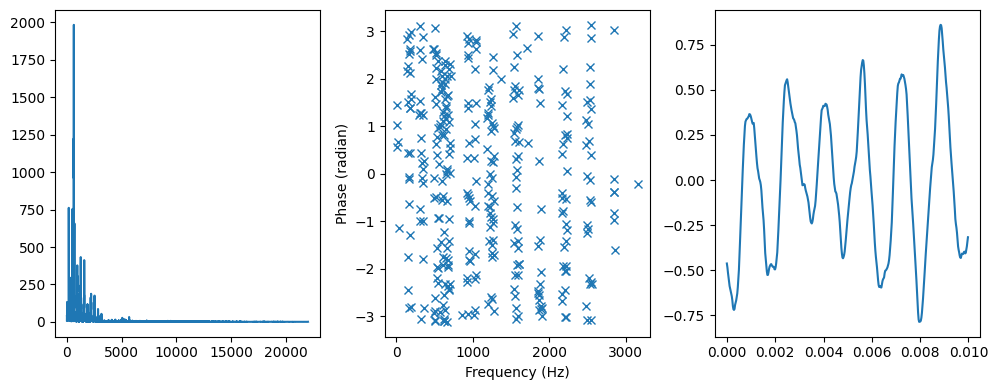

In [46]:
spectrum4 = random_angle(spectrum)
plot_three(spectrum4, thresh=50)

К звуку изначальной записи добавилось эхо.